In [1]:
import base64
import binascii
import collections
import difflib
import functools
import hashlib
import itertools
import json
import logging
import os
import os.path
import pickle
import random
import re
import shutil
import sys
import urllib.parse

from cssselect import HTMLTranslator, SelectorError
from lxml import html, etree
from unidecode import unidecode

import cachetools
import matplotlib
import matplotlib.pyplot as plt
import networkx as nx
import networkx.algorithms.tree
import networkx.algorithms.tree.mst
import networkx.readwrite.json_graph as nx_json
import numpy as np
import requests
import seaborn as sns

import plotly
import plotly.graph_objs
plotly.offline.init_notebook_mode(connected=True)

% matplotlib inline
matplotlib.rcParams['figure.figsize'] = (6.0, 3.0)

log = logging.getLogger(__name__)

## General Utils

In [2]:
# General utils
flatten = lambda l: [item for sublist in l for item in sublist]
array2color = lambda arr: 'rgb({})'.format(','.join(str(x) for x in arr))

def log_progress(sequence, every=None, size=None, name='Items'):
    """Utility to log progress of a for loop."""
    from ipywidgets import IntProgress, HTML, VBox
    from IPython.display import display

    is_iterator = False
    if size is None:
        try:
            size = len(sequence)
        except TypeError:
            is_iterator = True
    if size is not None:
        if every is None:
            if size <= 200:
                every = 1
            else:
                every = int(size / 200)     # every 0.5%
    else:
        assert every is not None, 'sequence is iterator, set every'

    if is_iterator:
        progress = IntProgress(min=0, max=1, value=1)
        progress.bar_style = 'info'
    else:
        progress = IntProgress(min=0, max=size, value=0)
    label = HTML()
    box = VBox(children=[label, progress])
    display(box)

    index = 0
    try:
        for index, record in enumerate(sequence, 1):
            if index == 1 or index % every == 0:
                if is_iterator:
                    label.value = '{name}: {index} / ?'.format(
                        name=name,
                        index=index
                    )
                else:
                    progress.value = index
                    label.value = u'{name}: {index} / {size}'.format(
                        name=name,
                        index=index,
                        size=size
                    )
            yield record
    except:
        progress.bar_style = 'danger'
        raise
    else:
        progress.bar_style = 'success'
        progress.value = index
        label.value = "{name}: {index}".format(
            name=name,
            index=str(index or '?')
        )

## Caching

In [3]:
# Load url_cache if one exists
try:
    home = os.path.expanduser("~") 
    with open(os.path.join(home, '/.dip_cache'), 'rb') as f:
        caches = pickle.load(f)
        size = f.tell()
    print('Caches loaded!, size is {} bytes!'.format(size))
except FileNotFoundError:
    print('Caches not found!')
    caches = {}

Caches not found!


In [4]:
def tuplify(x):
    if isinstance(x, list):
        return tuple(x)
    return x

def memoize(cache):
    '''Memoizes a function with the provided cache. Memoizes based only on
       positional args.
    '''
    def mem(f):
        @functools.wraps(f)
        def wrapper(*args, **kwargs):
            targs = tuple([tuplify(arg) for arg in args])
            if targs in cache:
                return cache[targs]
            else:
                res = f(*args, **kwargs)
                cache[targs] = res
                return res
        return wrapper
    return mem   

In [5]:
# Write url_cache
home = os.path.expanduser("~") 
dip_cache = os.path.join(home, '/.dip_cache')
if not os.path.isfile(dip_cache):
    with open(dip_cache, 'wb') as f:
        pickle.dump(caches, f)
    print('Wrote caches!')
else:
    print('Cache already exists, please delete it first!')

Cache already exists, please delete it first!


## Scraping utils

In [6]:
# Yes, I'm storing all HTML in memory
if 'get_url_cache' not in caches:
    caches['get_url_cache'] = cachetools.LRUCache(50000)
        
@memoize(caches['get_url_cache'])
def get_url(url):
    return requests.get(url).text

def get_page_tree(url):
    page = get_url(url)
    tree = html.fromstring(page)
    return tree

def make_sel(css):
    """Create a css selector."""
    try:
        exp = HTMLTranslator().css_to_xpath(css)
    except SelectorError:
        print('Invalid selector')
        return None
    return exp

def tree_sel(tree, css):
    """Use selector to select elements in an HTML tree."""
    sel = make_sel(css)
    return tree.xpath(sel)

def post_url(url, params):
    return requests.post(url, params).text

def save_image(url, filename):
    """Save an image to a file."""
    if os.path.isfile(filename):
        return
    # TODO: memoize
    r = requests.get(url, stream=True)
    if r.status_code == 200:
        with open(filename, 'wb') as f:
            r.raw.decode_content = True
            shutil.copyfileobj(r.raw, f)
        print('Created {}'.format(filename))
    else:
        raise Exception('Bad request to {}'.format(url))

In [7]:
def str_in_truecolor(rgb, string):
    """Uses truecolor escape sequences to colorize a string."""
    return '\x1b[38;2;{};{};{}m{}\x1b[0m'.format(rgb[0], rgb[1], rgb[2], string)

def hash_str(s):
    """Make a short hash out of a string."""
    m = hashlib.sha256()
    m.update(s.encode('utf-8'))
    return binascii.hexlify(m.digest()).decode('utf-8')[0:8]

## Scraping the congress' site
### Get congress' members

In [8]:
class Member():
    def __init__(self, name, party, url=None, email=None, state=None, district=None,
                 curul=None, plurinominal=None, substitute=None, substitute_of=None,
                 licencia=False, deceased=False):
        self.name = name
        self.party = party
        self.url = url
        self.email = email
        self.state = state
        self.district = district
        self.curul = curul
        self.plurinominal = plurinominal
        self.substitute = substitute
        self.substitute_of = substitute_of
        self.licencia = licencia
        self.deceased = deceased
        
        self.in_graph = False
        self.votes = 0
        self.abstentions = 0
        self.absences = 0
        self.in_graph = False
        
        self.id = hash_str('{}-{}'.format(name, party.name))
        
    def get_status(self):
        if self.deceased:
            return 'deceased'
        elif self.licencia:
            return 'licencia'
        return 'active'
    
    def get_absence_ratio(self):
        total = (self.votes + self.abstentions + self.absences)
        
        if total == 0:
            return 0
        
        return self.absences / total 
        
    def dict_repr(self):
        sub = None
        if self.substitute is not None and isinstance(self.substitute, Member):
            sub = self.substitute.id
        elif self.substitute is not None:
            sub = str(self.substitute)
            
        sub_of = None
        if self.substitute_of is not None and isinstance(self.substitute_of, Member):
            sub_of = self.substitute_of.id
        elif self.substitute_of is not None:
            sub_of = str(self.substitute_of)
            
        return {'name': self.name,
                'party': self.party.name.upper(),
                'substitute': sub,
                'substitute_of': sub_of,
                'url': self.url,
                'email': self.email,
                'state': self.state,
                'district': self.district,
                'curul': self.curul,
                'plurinominal': self.plurinominal,
                'id': self.id,
                'absences': self.absences,
                'licencia': self.licencia,
                'deceased': self.deceased,
                'in_plot': self.in_graph,
                'votes': self.votes,
                'abstentions': self.abstentions,
                'status': self.get_status(),
                'absence_ratio': self.get_absence_ratio(),
                'in_graph': self.in_graph}
    
    def __repr__(self):
        return self.__str__()
        
    def __str__(self):
        return str_in_truecolor(self.party.color, 'name={}, party={}'.format(self.name, self.party))
    
class Party():
    def __init__(self, name, color, url, long_name):
        self.name = name # For internal use only, 3 chars
        self.url = url
        self.color = color
        self.members = []
        self.long_name = long_name
    def add_member(self, new_member):
        self.members.append(new_member)
    def __repr__(self):
        return self.name
    def __str__(self):
        return str_in_truecolor(self.color, self.name)
    
base_party_url = 'http://sitl.diputados.gob.mx/LXIII_leg/listado_diputados_gpnp.php?tipot='
parties = {'pri': Party('pri', [255, 0, 0], base_party_url + '1',
                        'Partido Revolucionario Institucional'),
           'prd': Party('prd', [247, 192, 1], base_party_url + '2',
                        'Partido de la Revolución Democrática'),
           'pan': Party('pan', [6, 51, 142], base_party_url + '3',
                        'Partido Acción Nacional'),
           'pvem': Party('pvem', [80, 183, 71], base_party_url + '5',
                         'Partido Verde Ecologista'),
           'morena': Party('morena', [239, 180, 124], base_party_url + '14',
                           'Movimiento de Regeneración Nacional'),
           'mvc': Party('mvc', [245, 130, 32], base_party_url + '6',
                        'Movimiento Ciudadano'),
           'panal': Party('panal', [0, 164, 172], base_party_url + '12',
                          'Partido Nueva Alianza'),
           'pes': Party('pes', [83, 1, 117], base_party_url + '15',
                        'Partido Encuentro Social'),
           'ind': Party('ind', [200, 200, 200], base_party_url + '9',
                        'Independiente'),
           'unk': Party('unk', [0, 0, 0], base_party_url + '666',
                        'Desconocido')}

In [9]:
# Export parties to JSON
parties_json = {party.name: party.__dict__ for party in parties.values()}
with open('web/public/parties.json', 'w') as f:
    f.write(json.dumps(parties_json))

In [10]:
def get_party_members(url):
    tree = get_page_tree(url)
    els = tree_sel(tree, 'body > table > tr a')
    members = []
    for el in els:
        match = re.search('[0-9] (.*)$', el.text_content())
        if match != None:
            members.append(unidecode(match.group(1)))
    return members

all_members = {}
low = []

if 'similarity_cache' not in caches:
    caches['similarity_cache'] = cachetools.LRUCache(50000)
    
ignored_words = {'de', 'la', 'del', 'y'}
def is_ignored_word(word):
    return word in ignored_words

def explode_and_clean_name(name):
    words = name.split(' ')
    # Use only 4 words. 5 have  too many permutations.
    exploded = [word for word in words
                if word.lower() not in ignored_words][0:4] 
    if len(exploded) >= 5:
        log.warn('Warning, lots of words for {}'.format(name))
    return exploded
    
def get_best_match(name):
    ids_and_ratios = []
    for other_id, other in all_members.items():
        ratio = difflib.SequenceMatcher(is_ignored_word, other.name, name).ratio()
        ids_and_ratios.append((other_id, ratio))
    best_id, best_ratio = max(ids_and_ratios, key=lambda x: x[1])
    return best_id, best_ratio
    
@memoize(caches['similarity_cache'])
def get_member_id_by_similar_name(name):
    """Uses diff ratio to match a string to a member. Useful because strings scraped throughout the Congress' site
    are imperfect.
    """
#     print('Trying to fin match for {}'.format(name))
    best_id, best_ratio = get_best_match(name)
    if best_ratio < 0.8:
        msg = 'LOW SIMILARITY of {}. Would have matched {} with {}. Doing word dance:'
        msg = msg.format(best_ratio, name, all_members[best_id])
        low.append(name)
#         print(msg)
        
        perms = [perm for perm in itertools.permutations(explode_and_clean_name(name))]
            
        ids_and_ratios = [get_best_match(' '.join(perm)) for perm in perms]
        best_id, best_ratio = max(ids_and_ratios, key=lambda x: x[1])
        
    if best_ratio < 0.7:
        log.warn('REALLY LOW SIMILARITY ({}) FOR {}, matched with {}'.format(best_ratio, name, all_members[best_id]))
        return None
    return best_id

## Create members and assign them to parties

In [11]:
def clean_field(field):
    """Convert empty/bad scraped fields to None"""
    if field in {'', ' '}:
        return None
    return field.strip(' ')

def validate_email(email):
    if email is None:
        return None
    elif not re.match(r'[^@]+@[^@]+\.[^@]+', email): 
        print('Warning: weird email encountered: {}'.format(email))
        return None
    return email

def is_plurinominal(election_type):
    election_type = election_type.strip(' ')
    if election_type == 'Mayoría Relativa':
        return False
    elif election_type == 'Representación proporcional':
        return True
    else:
        raise Exception('Could not detect if member is plurinominal.')
        
def clean_state(state):
    if state == None:
        return None
    state = state.strip('.')
    if state == '':
        return None
    return state

def clean_name(name):
    licencia = False
    deceased = False
    if '(LICENCIA)' in name:
        name = re.sub('\(LICENCIA\)', '', name)
        licencia = True
    if '(DECESO)' in name:
        name = re.sub('\(DECESO\)', '', name)
        deceased = True
        
    name = re.sub('  +', ' ', name)
    name = name.strip()
    
    if name == '' or not re.search('[a-zA-Z]', name):
        return None, False, False
    
    return name, licencia, deceased
    
def scrape_members(base_url, get_images=False):
    imgsrc_to_party = {
        'images/pan.png': parties['pan'],
        'images/pri.png': parties['pri'],
        'images/pri01.png': parties['pri'],
        'images/prd.png': parties['prd'],
        'images/prd01.png': parties['prd'],
        'images/logvrd.jpg': parties['pvem'],
        'images/LogoMorena.jpg': parties['morena'],
        'images/logo_movimiento_ciudadano.png': parties['mvc'],
        'images/panal.gif': parties['panal'],
        'images/logo_SP.jpg': parties['ind'],
        'images/independiente.png': parties['ind'],
        'images/encuentro.png': parties['pes']
    }
    for i in log_progress(range(1, 1307)):
        url = base_url + str(i)
        tree = get_page_tree(url)
        # Get name
        els = tree_sel(tree, 'tr > td > font')
        for el in els:
            match = re.search('Dip. (.*)', el.text_content())
            if match != None:
                name, licencia, deceased = clean_name(match.group(1))
        # Get party
        els = tree_sel(tree, 'p > img')
        if len(els) == 0:
            print("No party image for {}:{}".format(i, name))
            party = parties['unk']
        for el in els:
            try:
                party = imgsrc_to_party[el.get('src')]
            except KeyError:
                print('Found party (image) you dont know about!')
                
        els = tree_sel(tree, 'tr > td font')
        election_type, state, district, curul, email = [clean_field(els[x].text_content()) for x in (6, 8, 10, 12, 14)]
        
        state = clean_state(state)
        email = validate_email(email)
        plurinominal = is_plurinominal(election_type)
        
        # Find substitute, if any
        substitute = None
        els = tree_sel(tree, 'tbody > tr')
        for el in els:
            tds = el.findall('td')
            if tds[0].text_content() == 'Suplente:':
                substitute = str(tds[1].text_content()).strip()
                
        if (name is not None) and (party is not None):
            member = Member(name, party, substitute=substitute, state=state, 
                            district=district, curul=curul, email=email, url=url,
                            plurinominal=plurinominal, licencia=licencia, deceased=deceased)
            # For repeated candidates, favor earliest
            if member.id not in all_members:
                all_members[member.id] = member
                party.add_member(member)
            
            # Get picture
            if get_images:
                els = tree_sel(tree, 'tr > td > img')
                if len(els) == 0:
                    print("No profile image for: {}".format(name))
                try:
                    save_image(urllib.parse.urljoin(base_url, els[1].get('src')), './web/public/img/{}.jpg'.format(member.id))
                except Exception as e:
                    print('Could not create image for {}'.format(url))
            
scrape_members('http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=', get_images=True)

VBox(children=(HTML(value=''), IntProgress(value=0, max=1306)))

Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=501
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=502
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=504
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=505
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=506
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=508
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=509
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=511
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=514
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=515
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=520
Could not create imag

Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=642
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=648
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=651
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=654
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=656
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=658
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=660
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=664
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=666
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=670
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=674
Could not create imag

Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=806
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=807
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=810
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=811
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=813
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=814
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=815
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=817
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=818
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=820
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=822
Could not create imag

Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=942
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=943
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=944
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=946
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=947
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=948
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=950
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=951
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=952
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=953
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=954
Could not create imag

Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1224
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1225
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1226
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1227
No party image for 1228:Miguel Enrique Lucia Espejo
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1228
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1229
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1230
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1231
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1232
Could not create image for http://sitl.diputados.gob.mx/LXIII_leg/curricula.php?dipt=1233
Could not create image for http://sitl.diputados

In [12]:
img_dir = 'web/public/img'
to_delete = []
for filename in os.listdir(img_dir):
    mid = filename.split('.')[0]
    if mid not in all_members.keys():
        to_delete.append(mid)
        os.remove(os.path.join(img_dir, filename))
print('deleting {} out of {} images'.format(len(to_delete), len(os.listdir(img_dir))))

deleting 0 out of 865 images


In [13]:
def resolve_substitutes(all_members):
    for _, member in log_progress(all_members.items()):
        if member.substitute is not None:
            if isinstance(member.substitute, str):
                sub_id = get_member_id_by_similar_name(member.substitute)
                if (sub_id is not None) and (sub_id in all_members.keys()):
                    member.substitute = all_members[sub_id]
                    all_members[sub_id].substitute_of = member.id
                else:
                    member.substitute = None
resolve_substitutes(all_members)

VBox(children=(HTML(value=''), IntProgress(value=0, max=1293)))

/home/diego/git/diputados/venv/lib/python3.6/site-packages/ipykernel_launcher.py:57: DeprecationWarning:

The 'warn' method is deprecated, use 'warning' instead

REALLY LOW SIMILARITY (0.23076923076923078) FOR - - -, matched with name=Vacante (Deceso - MC), party=mvc
REALLY LOW SIMILARITY (0.1875) FOR --- --- ---, matched with name=Vacante (Deceso - MC), party=mvc
REALLY LOW SIMILARITY (0.0) FOR , matched with name=Gerardo Federico Salas Díaz, party=pan


In [14]:
def remove_extras(roster_url):
    """Remove members that are not in the official roster, or are substitutes of one in the list."""
    not_extra = set()
    base_url = urllib.parse.urlparse(roster_url)
    roster_tree = get_page_tree(roster_url)
    els = tree_sel(roster_tree, '.linkVerde')
    for el in els:
        url = urllib.parse.urljoin(roster_url, el.attrib['href'])
        matches = [m for m in all_members.values() if m.url == url]
        if len(matches) != 1:
            raise ValueError('Error matching url to member: {}. Matches: {}'.format(url, matches))
        match = matches[0]
        not_extra.add(match.id)
        if match.substitute:
            not_extra.add(match.substitute.id)
    print('Keeping {} members'.format(len(not_extra)))
    return {k: v for k, v in all_members.items() if k in not_extra}
        
#all_members = remove_extras('http://sitl.diputados.gob.mx/LXIII_leg/listado_diputados_gpnp.php?tipot=TOTAL')

### Get a table of supporters and opponents of each decree

In [15]:
def get_dict_urls(url):
    tree = get_page_tree(url)
    els = tree_sel(tree, '#Derecho > table:nth-child(2) a')
    urls = []
    for el in els:
        urls.append(urllib.parse.urljoin(url, el.get('href')))
    return urls

def get_dict_vote_table_urls(dict_url):
    urls = []
    dict_tree = get_page_tree(dict_url)
    els = tree_sel(dict_tree, 'ul > li > a')
    for el in els:
        # Select only elements with word 'Votación' in contents
        if re.search('(v|V)otaci(o|ó)n', el.text_content()) != None:
            urls.append(urllib.parse.urljoin(dict_url, el.get('href')))
    return urls

if not 'voter_list_cache' in caches:
    caches['voter_list_cache'] = cachetools.LRUCache(5000)

@memoize(caches['voter_list_cache'])
def get_voter_list_html(url, param_keys, param_vals, type_key):
    # Type value is irrelevant (but must be int)
    params = {type_key: 1}
    params.update(dict(zip(param_keys, param_vals)))
    return post_url(url, params)
    
                                         
def get_dict_voter_trees(vote_table_url):
    vote_table_tree = get_page_tree(vote_table_url)

    voter_rel_endpoint = tree_sel(vote_table_tree, 'body > form')[0].get('action')
    param_keys = [el.get('name') for el in tree_sel(vote_table_tree, 'body > form > input')]
    param_vals = [el.get('value') for el in tree_sel(vote_table_tree, 'body > form > input')]

    voter_url = urllib.parse.urljoin(vote_table_url, voter_rel_endpoint)
    els = tree_sel(vote_table_tree, 'body input')
    votes_els = []
    # Filter for elements of vote table
    for el in els:
        el_type = el.get('type')
        if (el_type == 'submit') or (el_type == 'BUTTON'):
            votes_els.append(el)
    # First vote_el is supporters
    supporter_key = votes_els[0].get('name')
    opponent_key = votes_els[11].get('name')
    abstention_key = votes_els[22].get('name')
    absentees_key = votes_els[44].get('name')
    
    supporters_html = get_voter_list_html(voter_url, param_keys, param_vals, supporter_key)
    opponents_html = get_voter_list_html(voter_url, param_keys, param_vals, opponent_key)
    abstentions_html = get_voter_list_html(voter_url, param_keys, param_vals, abstention_key)
    absentees_html = get_voter_list_html(voter_url, param_keys, param_vals, absentees_key)
    
    supporters_tree = html.fromstring(supporters_html)
    opponents_tree = html.fromstring(opponents_html)
    abstention_tree = html.fromstring(abstentions_html)
    absentees_tree = html.fromstring(absentees_html)

    return (supporters_tree, opponents_tree, abstention_tree, absentees_tree)


In [16]:
print('Geting dictum URLs...')
dict_urls = get_dict_urls('http://gaceta.diputados.gob.mx/SIL/Dictamenes/63/Lista.html')

print('Getting vote table URLs...')
dict_vote_table_urls = flatten([get_dict_vote_table_urls(dict_url) for dict_url in dict_urls])

print('Getting voter table tree tuples...')
dict_voter_tree_tuples = [get_dict_voter_trees(x) for x
                          in log_progress(dict_vote_table_urls)]
print('Got {} voter table tree tuples.'.format(len(dict_voter_tree_tuples)))

Geting dictum URLs...
Getting vote table URLs...
Getting voter table tree tuples...


VBox(children=(HTML(value=''), IntProgress(value=0, max=725)))

Got 725 voter table tree tuples.


In [17]:
def get_dict_voters(voter_tree):
    """A clique is a group of voters who supported or opposed a single decree together
    voter_tree is the html tree with the list of voters
    relationship is a string describing whether the clique supported or opposed a decree
    """
    clique = []
    count = 0
    els = tree_sel(voter_tree, 'td[width="300"]')
    for el in els:
        try:
            num, text = el.text_content().split(':', 1)
        except ValueError:
            continue
        num = int(num)
        exit = False
        while not exit:
            num += 1
            try:
                voter, text = text.split(str(num) + ':', 1)
            except ValueError:
                exit = True
                voter = text
            count += 1
            member_id = get_member_id_by_similar_name(voter)
            if member_id in all_members:
                m = all_members[member_id]
                clique.append(m)
    return clique

def make_vote_table_row(tree_tuple):
    return [get_dict_voters(tree) for tree in tree_tuple]

dict_vote_table = [make_vote_table_row(tree) for tree
                   in log_progress(dict_voter_tree_tuples)]

VBox(children=(HTML(value=''), IntProgress(value=0, max=725)))

/home/diego/git/diputados/venv/lib/python3.6/site-packages/ipykernel_launcher.py:57: DeprecationWarning:

The 'warn' method is deprecated, use 'warning' instead

REALLY LOW SIMILARITY (0.6428571428571429) FOR Camacho Quiroz César Octavio, matched with name=Cesar Octavio Pedroza Gaitan, party=pan
REALLY LOW SIMILARITY (0.6909090909090909) FOR Etcheverry Aranda Maricela Emilse, matched with name=Azul Etcheverry Aranda, party=pri
REALLY LOW SIMILARITY (0.2916666666666667) FOR MORALES TOLEDO ANTONINO, matched with name=Vacante (Deceso - MORENA), party=morena
REALLY LOW SIMILARITY (0.26666666666666666) FOR ITURBE ROSAS ALEJANDRA, matched with name=Dora Elena Real Salinas, party=pri


In [18]:
absentism_lists = [absentees for _, _, _, absentees in dict_vote_table]
abstention_lists = [abstentions for _, _, abstentions, _ in dict_vote_table]
vote_lists = [(in_favor, against) for in_favor, against, _, _ in dict_vote_table]

In [19]:
for list_tuple in vote_lists:
    for vote_list in list_tuple:
        for voter in vote_list:
            voter.votes += 1
        
for abs_list in absentism_lists:
    for absentee in abs_list:
        absentee.absences += 1
        
for abs_list in abstention_lists:
    for abstent in abs_list:
        abstent.abstentions += 1

### Plot absence distribution

[0.0, 0.0, 0.0, 0.0, 1.0, 37.0, 85.0, 138.0, 201.0]


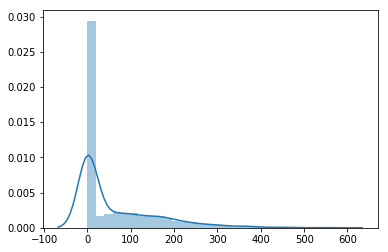

In [20]:
absences = [m.absences for m in all_members.values()]
print([np.percentile(absences, ptile) for ptile in np.arange(10, 100, 10)])
sns.distplot(absences)

# Network analysis
## Create agreement and disagreement networks

In [21]:
def init_graph(parties):
    g = nx.Graph()
    g.add_nodes_from([mid for mid in all_members.keys()])
    return g

In [22]:
def draw_agreement_edges(g, vote_lists):
    edges = {}
    for row in log_progress(vote_lists):
        for clique in row:
            for pair in itertools.combinations(clique, 2):
                pair = [x.id for x in pair]
                # Undirected
                pair = tuple(sorted(pair))
                if pair in edges:
                    edges[pair] += 1.0
                else:
                    edges[pair] = 1.0
                
    edge_tuples = [(unidecode(v), unidecode(k), w) for (v,k), w in edges.items()]
    g.add_weighted_edges_from(edge_tuples)
    
def draw_disagreement_edges(g, vote_lists):
    edges = {}
    for row in log_progress(vote_lists):
        for pair in itertools.product(row[0], row[1]):
            pair = [x.id for x in pair]
            pair = tuple(sorted(pair))
            if pair in edges:
                edges[pair] += 1.0
            else:
                edges[pair] = 1.0
                
    edge_tuples = [(unidecode(v), unidecode(k), w) for (v,k), w in edges.items()]
    g.add_weighted_edges_from(edge_tuples)

a_g = init_graph(parties)
d_g = init_graph(parties)

draw_agreement_edges(a_g, vote_lists)
draw_disagreement_edges(d_g, vote_lists) 

VBox(children=(HTML(value=''), IntProgress(value=0, max=725)))

VBox(children=(HTML(value=''), IntProgress(value=0, max=725)))

## Draw static networks

In [23]:
def draw_graph(g, layout=None):
    if layout == 'reingold':
        pos = nx.fruchterman_reingold_layout(g) 
    else:
        pos = nx.spring_layout(g)
    for party_name, party in parties.items():
        party_nodes = [mid for mid in g.nodes
                       if all_members[mid].party.name == party_name]
        #print(party.color)
        nx.draw_networkx_nodes(g, pos,
                               nodelist=party_nodes,
                               node_color=[[col / 255 for col in party.color]],
                               node_size=100)
    nx.draw_networkx_edges(g, pos)
    plt.show()
    
#draw_graph(a_g, layout='reingold')
#draw_graph(d_g, layout='reingold')

## Analyse some network properties

Agreement: 10th ptile: 0.0
90th pile: 206708.2


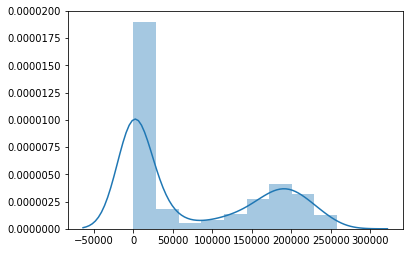

Disagreement: 10th ptile: 0.0
90th pile: 12294.199999999997


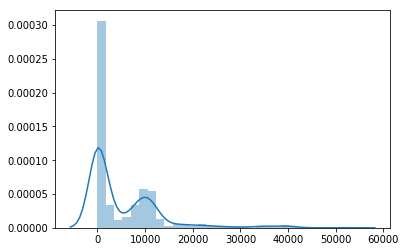

In [24]:
def analyse_deg(g, which):
    g_degs = g.degree(weight='weight')
    nx.set_node_attributes(g, dict(g_degs), name='weighted-degree')
    degs = [deg for _, deg in g_degs]
    ptiles = np.percentile(degs, np.arange(0, 100, 1), interpolation='linear')
    print('{}: 10th ptile: {}\n90th pile: {}'.format(which, ptiles[10], ptiles[90]))
    sns.distplot(degs)
    plt.show()
    
analyse_deg(a_g, 'Agreement')
analyse_deg(d_g, 'Disagreement')

### Plot node betweenness distribution

Agreement: 5th ptile: 0.0
90th ptile: 0.00015560528917469462


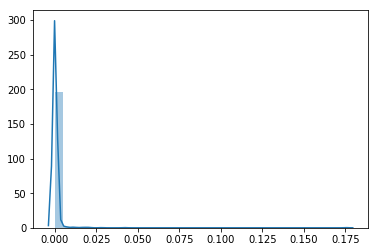

Disagreement: 5th ptile: 0.0
90th ptile: 0.0006081993449941393


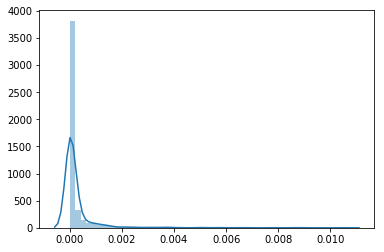

In [25]:
def analyse_betweeness(g, which):
    g_betws = nx.betweenness_centrality(g, weight='weight')

    nx.set_node_attributes(g, g_betws, name='betweenness')

    betws = [deg for _, deg in g_betws.items()]

    ptiles = np.percentile(betws, np.arange(0, 100, 1), interpolation='linear')

    print('{}: 5th ptile: {}\n90th ptile: {}'.format(which, ptiles[5], ptiles[90]))
    sns.distplot(betws)
    plt.show()

analyse_betweeness(a_g, 'Agreement')
analyse_betweeness(d_g, 'Disagreement')

### Plot edge weight distribution

Agreement: 1st ptile: 4.0
99th ptile: 564.0


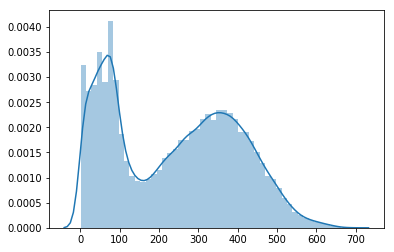

Disagreement: 1st ptile: 1.0
99th ptile: 107.0


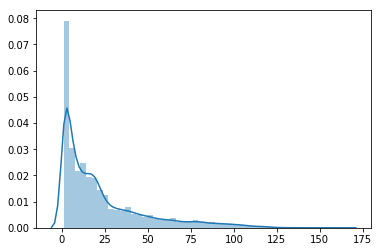

In [26]:
def analyse_edge_weights(g, which):
    edge_weights = [d['weight'] for u,v,d in g.edges(data=True)]

    ptiles = np.percentile(edge_weights, np.arange(0, 100, 1), interpolation='linear')

    print('{}: 1st ptile: {}\n99th ptile: {}'.format(which, ptiles[1], ptiles[99]))
    sns.distplot(edge_weights)
    plt.show()

analyse_edge_weights(a_g, 'Agreement')
analyse_edge_weights(d_g, 'Disagreement')

### Start working on a copy

In [27]:
a_g_cpy = a_g.copy()
d_g_cpy = d_g.copy()

### Maximum spanning tree 

In [28]:
def mark_mst(g):
    g.remove_nodes_from(list(nx.isolates(g)))
    mses = list(networkx.algorithms.tree.mst.maximum_spanning_edges(g, weight='weight'))
    mses = {(origin, dest): True for origin, dest, _ in mses}
    nx.set_edge_attributes(g, mses, name='mst')
    
mark_mst(a_g_cpy)
mark_mst(d_g_cpy)

### Keep only edges with extreme degrees and nodes with high betweenness centrality

In [29]:
def keep_extremes(g, weight_ptile_cutoff=10, degree_ptile_cutoff=50):
    # Delete non-extreme edges
    edge_weights = [d['weight'] for u,v,d in g.edges(data=True)]
    weight_cutoff = np.percentile(edge_weights, 100 - weight_ptile_cutoff, interpolation='linear')
    print('Deleting edges with weight below {}'.format(weight_cutoff))
    edges_to_delete = [(u,v) for u,v,d in g.edges(data=True)
                       if d['weight'] < weight_cutoff
#                        and not 'mst' in d
                      ]
    g.remove_edges_from(edges_to_delete)
    print('Deleted {} edges'.format(len(edges_to_delete)))
    
    # Delete nodes with non-extreme weighted-degree
    g_degs = g.degree(weight='weight')
    nx.set_node_attributes(g, dict(g_degs), name='weighted-degree')
    betws = [data['weighted-degree'] for _, data in g.nodes(data=True)]
    betws_cutoff = np.percentile(betws, degree_ptile_cutoff, interpolation='linear')
    nodes_to_delete = [node for node, attrs in g.nodes(data=True)
                       if (attrs['weighted-degree'] <= betws_cutoff)]
    print('Deleting {} low degree nodes'.format(len(nodes_to_delete)))
    g.remove_nodes_from(nodes_to_delete)
    
    print('Connected components', nx.number_connected_components(g))
    print('Connected size: ', len(list(g.nodes)) - len([node for node, data in g.nodes(data=True) if 'isolate' in data]))
    
    # Mark nodes with no remaining edges
    isolates = list(nx.isolates(g))
    
    g.remove_nodes_from(isolates)
    
def remove_inactive(g):
    nodes = g.nodes()
    inactives = [all_members[id].curul for id in nodes]
    print('Removing {} inactive'.format(len(inactives)))
    g.remove_nodes_from(inactives)
    
def remove_absentees(g, cutoff=20):
    nodes = g.nodes()
    cutoff = np.percentile([all_members[id].absences for id in nodes], 100 - cutoff)
    absentees = [id for id in nodes
                 if all_members[id].absences > cutoff ]
    print('Removing {} absentees'.format(len(absentees)))
    g.remove_nodes_from(absentees)
    
def cleanup(g):
    remove_inactive(g)
    remove_absentees(g)
    keep_extremes(g)
    
print('Agreement:')
cleanup(a_g_cpy)
print('Disagreement:')
cleanup(d_g_cpy)

Agreement:
Removing 664 inactive
Removing 133 absentees
Deleting edges with weight below 476.0
Deleted 113005 edges
Deleting 267 low degree nodes
Connected components 1
Connected size:  264
Disagreement:
Removing 663 inactive
Removing 133 absentees
Deleting edges with weight below 68.0
Deleted 82566 edges
Deleting 265 low degree nodes
Connected components 1
Connected size:  265


In [30]:
print('Amount of edges: {}'.format(len(a_g_cpy.edges)))

Amount of edges: 12677


In [31]:
[all_members[id] for id in a_g_cpy.nodes if all_members[id].party.name == 'morena']

[name=Juan Romero Tenorio, party=morena,
 name=Virgilio Dante Caballero Pedraza, party=morena,
 name=Ernestina Godoy Ramos, party=morena,
 name=Patricia Elena Aceves Pastrana, party=morena,
 name=Jesús Emiliano Álvarez López, party=morena,
 name=María Chávez García, party=morena,
 name=Jerónimo Alejandro Ojeda Anguiano, party=morena,
 name=Araceli Damián González, party=morena,
 name=Ana Leticia Carrera Hernández, party=morena,
 name=Renato Josafat Molina Arias, party=morena,
 name=Roberto Alejandro Cañedo Jiménez, party=morena,
 name=Alfredo Basurto Román, party=morena,
 name=Mariana Trejo Flores, party=morena,
 name=Guadalupe Hernández Correa, party=morena,
 name=Modesta Fuentes Alonso, party=morena,
 name=Ángel Antonio Hernández de la Piedra, party=morena,
 name=Blanca Margarita Cuata Domínguez, party=morena,
 name=Miguel Alva y Alva, party=morena,
 name=Laura Beatriz Esquivel Valdés, party=morena,
 name=Roberto Guzmán Jacobo, party=morena,
 name=Blandina Ramos Ramírez, party=morena

### Add edge betweenness

In [32]:
def add_edge_betweenness(g):
    g_ebetws = nx.edge_betweenness_centrality(g)
    nx.set_edge_attributes(g, g_ebetws, name='btws')
    
#add_edge_betweenness(a_g_cpy)
#add_edge_betweenness(d_g_cpy)

### Mark 5 heaviest neighboring edges for each node

In [33]:
def mark_top5_edges(g):
    for node_id in list(g.nodes):
        edges = g.edges([node_id], data=True)
        edges = sorted(edges, key=lambda e: e[2]['weight'])[-5:]
        for _, _, edge_data in edges:
            if ('key_nodes' in edge_data) and (node_id not in edge_data['key_nodes']):
                edge_data['key_nodes'].append(node_id)
            else:
                edge_data['key_nodes'] = [node_id]
        nx.set_edge_attributes(g, {(u, v): d for (u, v, d) in edges})
    
mark_top5_edges(a_g_cpy)

### Update members in the graph 

In [34]:
for m_id in a_g_cpy.nodes:
    all_members[m_id].in_graph = True

## Visualize the graphs

In [35]:
def add_layout_positions(g):
    pos = nx.fruchterman_reingold_layout(g) 
    nx.set_node_attributes(g, pos, name='pos')
    
def draw_graph_fancy(g, filename, color_absences=False, export=False):
    edge_trace = plotly.graph_objs.Scatter(
    x=[],
    y=[],
    line=plotly.graph_objs.Line(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')
    
    for edge in g.edges():
        x0, y0 = g.node[edge[0]]['pos']
        x1, y1 = g.node[edge[1]]['pos']
        edge_trace['x'] += [x0, x1, None]
        edge_trace['y'] += [y0, y1, None]
    
    node_trace = plotly.graph_objs.Scatter(
        x=[],
        y=[],
        text=[],
        mode='markers',
        hoverinfo='text',
        marker=plotly.graph_objs.Marker(
            showscale=color_absences,
            colorscale='YIGnBu',
            reversescale=True,
            color=[],
            size=10,
            line=dict(width=2)))
    
    for node in g.nodes():
        x, y = g.node[node]['pos']
        node_trace['x'].append(x)
        node_trace['y'].append(y)
    
    for node, adjacencies in enumerate(g.adjacency()):
        node_id = list(g.nodes)[node]
        member = all_members[node_id]
        
        if color_absences:
            node_trace['marker']['color'].append(member.absences)
        else:
            node_trace['marker']['color'].append(array2color(member.party.color))
            
        node_info = '# of connections: ' + str(len(adjacencies))
        node_info = '{}: {}'.format(member.party.name.upper(), member.name)
        node_trace['text'].append(node_info)
        
    fig = plotly.graph_objs.Figure(data=plotly.graph_objs.Data([edge_trace, node_trace]),
              layout=plotly.graph_objs.Layout(
                 titlefont=dict(size=16),
                 showlegend=False,
                 hovermode='closest',
                 margin=dict(b=20,l=5,r=5,t=40),
                 xaxis=plotly.graph_objs.XAxis(showgrid=False, zeroline=False, showticklabels=False),
                 yaxis=plotly.graph_objs.YAxis(showgrid=False, zeroline=False, showticklabels=False))) 
    if not export:
        plotly.offline.iplot(fig, filename=filename)
    else:
        plotly.offline.plot(fig, filename=filename, auto_open=False)

In [36]:
add_layout_positions(a_g_cpy)
add_layout_positions(d_g_cpy)

In [37]:
export_plotly = False
draw_graph_fancy(a_g_cpy, 'agreement.html', export=export_plotly)

In [38]:
draw_graph_fancy(a_g_cpy, 'agreement_absences.html', color_absences=True, export=export_plotly)

In [39]:
draw_graph_fancy(d_g_cpy, 'disagreement.html', export=export_plotly)

## Export to JSON

### Export graph 

In [40]:
def export_to_json(g):
    colors = {id: all_members[id].party.color for id in g.nodes}
    nx.set_node_attributes(g, colors, name='color')

    js = nx_json.node_link_data(g)
    for node in js['nodes']:
        node['pos'] = tuple(node['pos'])
    with open('web/public/diputados.json', 'w') as f:
        f.write(json.dumps(js))
        
export_to_json(a_g_cpy)

### Mark members in the graph

In [41]:
for m_id in a_g_cpy.nodes:
    all_members[m_id].in_graph = True

### Export roster

In [42]:
with open('web/public/roster.json', 'w') as f:
    data = {id: m.dict_repr() for id, m in all_members.items() if m.votes > 0}
    f.write(json.dumps(data))